# **ИССЛЕДОВАНИЕ РЫНКА МОСКВЫ ДЛЯ ИНВЕСТИЦИЙ В НОВУЮ ТОЧКУ ОБЩЕСТВЕННОГО ПИТАНИЯ**

Получены данные с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
Посмотрим проходимости мест, рейтинги и популярность уже существующих, средний чек и количество посадочных мест.
Проверим возможность открытия кофейни, как в сериале "Друзья".

## Загрузим данные


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import json
# импортируем карту, хороплет, маркеры и иконки
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon

with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)
import os    

In [2]:
#path = '/datasets/moscow_places.csv'
places1 = 'datasets/moscow_places.csv'
places2 = '/datasets/moscow_places.csv'
if os.path.exists(places1):
    places = 'vdatasets/moscow_places.csv'
elif os.path.exists(places2):
    places = pd.read_csv(places2)
else:
    print('Something is wrong')
#places = pd.read_csv(path) 


In [3]:
display(places.info())
display(places.head(5))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Описание данных:

*name* — название заведения;

*address* — адрес заведения;

*category* — категория заведения, например «кафе», «пиццерия» или «кофейня»;

*hours* — информация о днях и часах работы;

*lat* — широта географической точки, в которой находится заведение;

*lng* — долгота географической точки, в которой находится заведение;

*rating* — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

*price* — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

*avg_bill* — строка, которая хранит среднюю стоимость заказа в виде: "Средний счёт:1000–1200 ₽" или "Средний счёт:от 500 ₽"

*middle_avg_bill* — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
    
*middle_coffee_cup* — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  
    Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    
*chain* — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

    0 — заведение не является сетевым
    1 — заведение является сетевым
    
*district* — административный район, в котором находится заведение, например Центральный административный округ;

*seats* — количество посадочных мест.

In [4]:
print(f'Количество полных дубликатов: {places.duplicated().sum()} \n')
print(f'Количество уникальных значений: {places.nunique()} \n')
print(f'Количество пропусков: {places.isna().sum()}')
places.duplicated(['name', 'address']).sum()

Количество полных дубликатов: 0 

Количество уникальных значений: name                 5614
category                8
address              5753
district                9
hours                1307
lat                  8209
lng                  8258
rating                 41
price                   4
avg_bill              897
middle_avg_bill       230
middle_coffee_cup      96
chain                   2
seats                 229
dtype: int64 

Количество пропусков: name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


0

### Промежуточный вывод:
Явных дубликатов - 0, но значений в столбце name - 8406, а уникальных названий - 5614. Видимо, это из-за присутствия одинаковых названий сетевых заведений, ну и просто плагиата у владельцев заведений.

Дубликатов с одинаковым названием и адресом также нет.
Названия столбцов адекватны и информативны. Формат представленных данных в каждом столбце - правильный, кроме seats - лучше float заменить на целые числа. Все-таки количество мест в кафе не бывает дробным. 

В основных данных пропусков нет. Они хорошо подготовлены.

Но в данных price(категория цен), avg_bill(средний чек, middle_avg_bill(средняя сумма чека), middle_coffee_cup(средняя стоимость чашки кофе), seats(количество мест) - довольно много пропусков. Видимо, эта категория данных относится к тем , которые заполняют самостоятельно пользователи этих заведений. Попробуем исправить или нивелировать эти пропуски. 


## Предобработка данных

In [5]:
places['seats'] = places['seats'].fillna(0)
places['seats']=places['seats'].astype(int)
places.describe()
# заменим NaN в seats(число посадочных мест) на 0 и сделаем эти данные - целочисленными. Полстула в кафе не бывает.)))

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,8406.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,61.846538
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,107.175995
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,0.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,20.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,85.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


### Посмотрим на экстремальные значения

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288
6684,Пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,NaN,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288


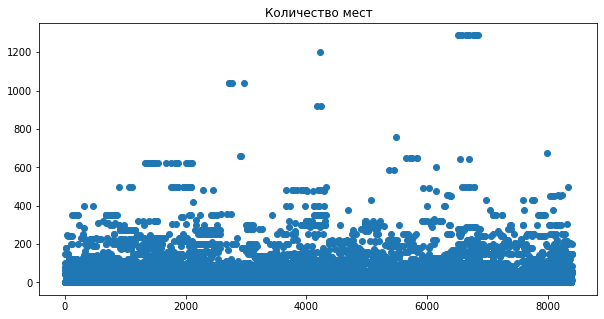

In [6]:
display(places.query('seats==1288'))
x_values = pd.Series(range(0,len(places['seats'])))

fig = plt.figure(figsize=[10,5])
plt.title('Количество мест')
plt.scatter(x_values, places['seats'])

Есть выбросы до 1288 мест в заведении. Но это должен быть какой-то большой банкетный зал, ну ни как ни One Price Coffee или Alternative coffee, например. Посмотрим, какое количество заведений имеет число посадочных мест более 600. Так как по графику видно, что частота выбросов становится меньше при значениях выше 600.


In [7]:
print('Процент заведений с числом мест больше 600:', (100*places[places['seats'] > 600]['name'].count()/places['name'].count()), '%')

Процент заведений с числом мест больше 600: 0.6305020223649774 %


In [8]:
places600 = places.query('seats <= 600')
display(places600.query('seats > 600')) # смотрим остались ли заведения с местами > 600
places600.info()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


<class 'pandas.core.frame.DataFrame'>
Int64Index: 8353 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8353 non-null   object 
 1   category           8353 non-null   object 
 2   address            8353 non-null   object 
 3   district           8353 non-null   object 
 4   hours              7824 non-null   object 
 5   lat                8353 non-null   float64
 6   lng                8353 non-null   float64
 7   rating             8353 non-null   float64
 8   price              3296 non-null   object 
 9   avg_bill           3794 non-null   object 
 10  middle_avg_bill    3133 non-null   float64
 11  middle_coffee_cup  529 non-null    float64
 12  chain              8353 non-null   int64  
 13  seats              8353 non-null   int64  
dtypes: float64(5), int64(2), object(7)
memory usage: 978.9+ KB


Убрали заведения с количеством посадочных мест более 600, так как их количество менее 1%.

Посмотрим на отсутствующие значения в колонках со средним чеком. Попробуем часть данных восполнить. Столбец "middle_avg_bill" заполняется из столбца "avg_bill". посмотрим на эти столбцы, когда в столбце "middle_avg_bill" - нет значения, а в "avg_bill" - есть. Что это за данные.

In [9]:
dubl = []
dubl = places600
dubl['middle_avg_bill'] = dubl['middle_avg_bill'].fillna(0)
dubl['avg_bill'] = dubl['avg_bill'].fillna(0)
dubl1=dubl[dubl['middle_avg_bill'] == 0]
dubl1=dubl1[dubl1['avg_bill'] != 0]
display(dubl1)
dubl1[dubl1['avg_bill'].str.contains(r'ред(?!$)')] # смотрим что осталось со словами Средний или средний (*ред*)

/tmp/ipykernel_97/4032185104.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dubl['middle_avg_bill'] = dubl['middle_avg_bill'].fillna(0)
/tmp/ipykernel_97/4032185104.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dubl['avg_bill'] = dubl['avg_bill'].fillna(0)


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,0.0,170.0,0,0
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.877832,37.469171,4.5,средние,Цена бокала пива:250–350 ₽,0.0,NaN,0,102
67,Штаб квартира,"бар,паб","Москва, Дубнинская улица, 32",Северный административный округ,"пн-чт 12:30–00:00; пт,сб 12:30–02:00; вс 12:30...",55.883112,37.558867,5.0,средние,Цена бокала пива:120–350 ₽,0.0,NaN,0,16
72,Лакрица,кофейня,"Москва, Алтуфьевское шоссе, 85",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.891196,37.585653,4.5,средние,Цена чашки капучино:150–190 ₽,0.0,170.0,0,12
81,Coffee Way,кофейня,"Москва, Алтуфьевское шоссе, 86, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.897789,37.588189,4.3,NaN,Цена чашки капучино:120–170 ₽,0.0,145.0,1,120
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8342,Coffee Week,кофейня,"Москва, Рязанский проспект, 30, корп. 2",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.718199,37.784447,4.3,NaN,Цена чашки капучино:120–220 ₽,0.0,170.0,0,116
8348,Bonjour,кофейня,"Москва, Шоссейная улица, 8",Юго-Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 08:00–21:00",55.689958,37.725969,4.7,средние,Цена чашки капучино:130–190 ₽,0.0,160.0,0,0
8365,Квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,0.0,160.0,0,206
8385,Cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,0.0,100.0,0,0


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3688,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200


Получается, что с отсутствующими значениями в middle_avg_bill, но с данными в avg_bill - это кофейни и бары,пабы. И там значения avg_bill - это цена чашки или бокала пива. и по столбцу avg_bill заполняется уже другой столбец - middle_coffee_cup. Поэтому эти значения в middle_avg_bill отсутствуют. Заполнять их чем-то нецелесообразно.

### Промежуточный вывод
Убрали заведения с посадочными местами более 600, так как их 0.63% от всех, то эта коррекция не повлияет существенно на дальнейший анализ. Проверили данные по среднему чеку и оставили их без изменений, так как они внесены корректно, но с большим количеством пропусков. Заполнять эти пропуски средним по району или категории заведения нет смысла, так как слишком много факторов влияющих на эти значения: и местоположение, и отношение к сети, и просто отношение посетителей.


### Добавим столбец street

In [10]:

address = places['address'].str.split(', ', expand=True)
places600['street'] = address[1]

display(places600.tail())

/tmp/ipykernel_97/1231519454.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  places600['street'] = address[1]


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,0,0.0,NaN,0,86,Профсоюзная улица
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,0,0.0,NaN,0,150,Пролетарский проспект
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150,Люблинская улица
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,0,0.0,NaN,1,150,Люблинская улица
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,0,0.0,NaN,0,12,Россошанский проезд


### Добавим столбец is_24/7
с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
  
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.

In [11]:
places600['is_24/7'] = places600['hours'].str.contains('ежедневно, круглосуточно')
display(places600.head(20))

/tmp/ipykernel_97/877567342.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  places600['is_24/7'] = places600['hours'].str.contains('ежедневно, круглосуточно')


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,0,0.0,NaN,0,0,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,0.0,170.0,0,0,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,0,0.0,NaN,0,0,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65,Ангарская улица,False


### Вывод
Убрали выбросы по данным количества посадочных мест: более 600, проверили правильность заполнения столбцов про средний чек - все отлично, добавили 2 новых столбца - улицы и работа круглосуточно.

## Анализ данных

### Посмотрим какие категории заведений существуют

In [12]:
categorys = places600.groupby('category').agg({'address' : 'count'}).sort_values(by='address', ascending=False).reset_index()
categorys = categorys.rename(columns={'category':'category','address':'total'})
total = categorys['total'].sum()

categorys['cat_pct'] = (100*categorys['total']/total).round(0)
categorys



,category,total,cat_pct
0,кафе,2366,28.0
1,ресторан,2031,24.0
2,кофейня,1401,17.0
3,"бар,паб",756,9.0
4,пиццерия,629,8.0
5,быстрое питание,602,7.0
6,столовая,313,4.0
7,булочная,255,3.0


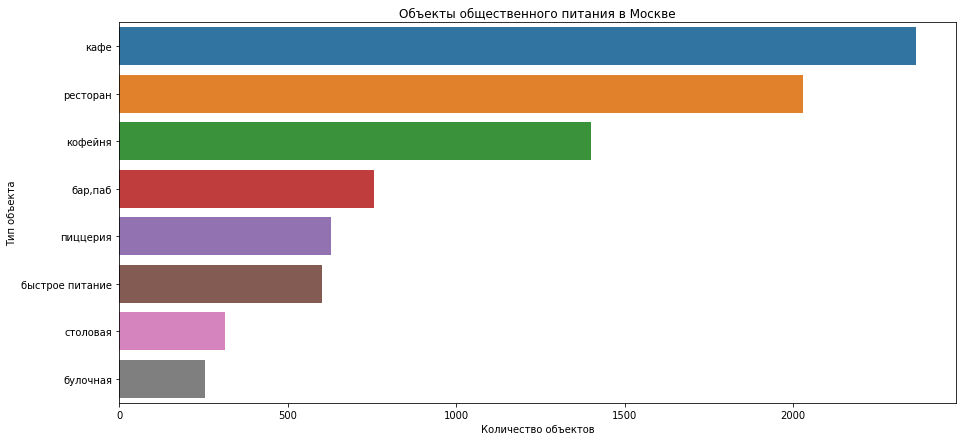

In [13]:
f, ax = plt.subplots(figsize=(15, 7))
ax = sns.barplot(x='total', y='category', data=categorys)
ax.set_title('Объекты общественного питания в Москве')
ax.set_xlabel('Количество объектов')
ax.set_ylabel('Тип объекта')
plt.show()

In [14]:
#places600['category'].value_counts(sort=True)     #круговая диаграмма - на память)))
#explode = (0, 0, 0, 0.3, 0, 0, 0.15, 0)
#colors = ( "red", "orange", "yellow", 
          #"lightgreen", "blue", "lightblue", "violet", "pink") 
#places600.groupby('category')['name'].count().plot(kind='pie', y='category', autopct='%1.0f%%', figsize=(20, 10), explode=explode, colors=colors)


Больше всего: кафе - 28% - 2366, 

Ресторанов также много - 24% от общего числа заведений общепита - 2031,

Меньше всего булочных - 3% (255 штук), так как они обычно рассматриваются посетителями, как место покупки еды(выпечки), а не место питания и не в каждой булочной предусмотрена продажа напитков, что обычно, посетители напрямую связывают с возможностью перекусить.

Малое количество столовых -4% (313 штук) объясняется тем, что еще с 90х годов столовые переименовывались или переделывались, в основном, в кафе, для привлечения более платежеспособного клиента. А сейчас фактически остались столовые при каком-то предприятии или учебном заведении.

### Посмотрим на посадочные места

In [15]:
def ann(ax, feature):    #функция - надписи над барами
    total = len(feature)
    for p in ax.patches:
        per = p.get_height()
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(per.round(2), (x, y), size = 12)

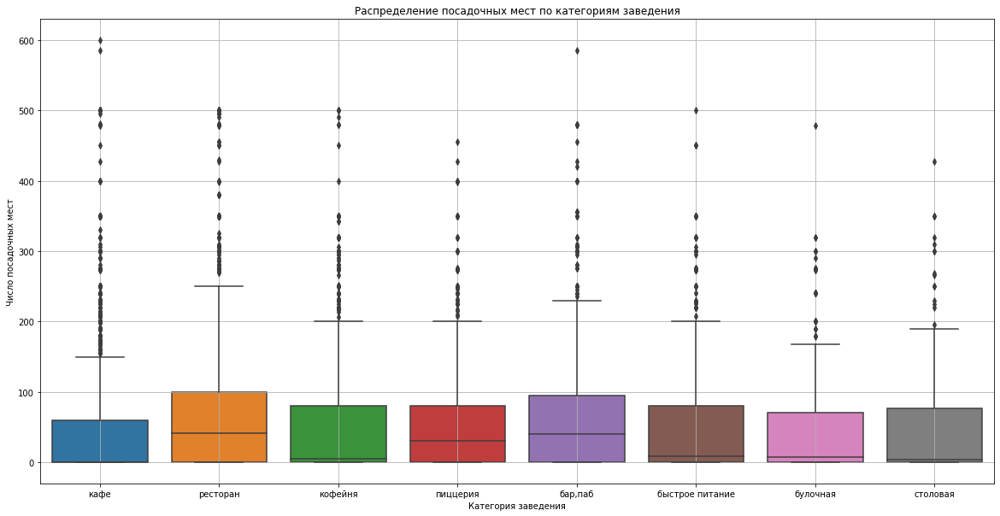

In [16]:
plt.figure(figsize=(20, 10))
sns.boxplot(x='category', y='seats', data=places600) 
plt.ylabel('Число посадочных мест')
plt.xlabel('Категория заведения')

plt.grid()
plt.title('Распределение посадочных мест по категориям заведения')
plt.show()

Наибольшее число посадочных мест в ресторанах, но такова и специфика заведений, люди приходят в рестораны посидеть, отдохнуть, поесть. Меньше всего мест в пиццерии, тоже объяснимо - часто такие заведения открывают с большей направленностью на работу "на вынос".

### Посмотрим на сети.

In [17]:
places600['chain'].value_counts(sort=True)

0    5174
1    3179
Name: chain, dtype: int64

<AxesSubplot:title={'center':'Количество сетевых заведений'}, ylabel='name'>

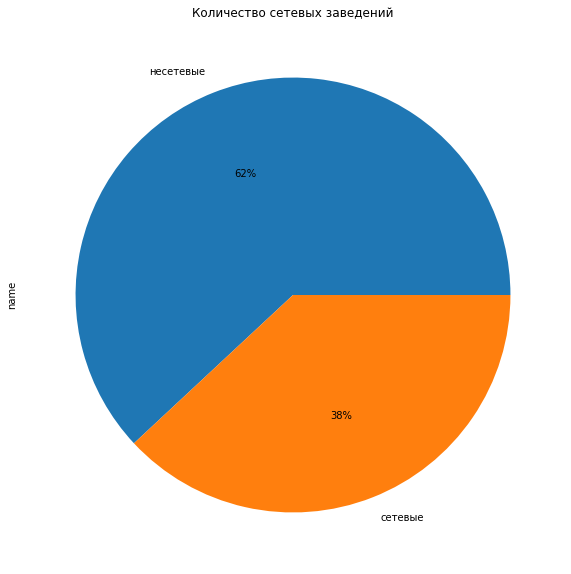

In [18]:
plt.title('Количество сетевых заведений')
places600.groupby('chain')['name'].count().plot(kind='pie', y='chain', autopct='%1.0f%%', figsize=(20, 10), labels=['несетевые', 'сетевые'])

Несетевых заведений больше почти в полтора раза.

In [19]:
#chains = places600.groupby(['category','chain'])['name'].count().reset_index()
#chains.columns = ['category', 'chain', 'count']
#chains=chains.sort_values(by='count', ascending = False)

chains = places600.groupby(['category', 'chain'])['chain'].count()
chains.name='count'
chains = chains.reset_index()
print(chains)

fig = px.bar(chains, 
             x='category',
             y='count', 
             text='count',                   
             color='chain',
             )

fig.update_layout(title='Соотношение сетевых заведений',
                   yaxis_title='Количество заведений',
                   xaxis_title='Категория заведения',
                   xaxis={'categoryorder':'total descending'}
                 )
fig.show() 

           category  chain  count
0           бар,паб      0    588
1           бар,паб      1    168
2          булочная      0     99
3          булочная      1    156
4   быстрое питание      0    371
5   быстрое питание      1    231
6              кафе      0   1592
7              кафе      1    774
8           кофейня      0    688
9           кофейня      1    713
10         пиццерия      0    301
11         пиццерия      1    328
12         ресторан      0   1309
13         ресторан      1    722
14         столовая      0    226
15         столовая      1     87


In [20]:
chains_rate = places600.pivot_table(index='category', values = 'name', columns = 'chain', aggfunc='count')
chains_rate['total']=chains_rate[0]+chains_rate[1]
chains_rate['rate']=(chains_rate[1]/chains_rate['total']).round(2)
chains_rate = chains_rate.sort_values(by='rate')
chains_rate.columns = ['chain0', 'chain1', 'total', 'rate']
display(chains_rate)




,chain0,chain1,total,rate
category,,,,
"бар,паб",588,168,756,0.22
столовая,226,87,313,0.28
кафе,1592,774,2366,0.33
ресторан,1309,722,2031,0.36
быстрое питание,371,231,602,0.38
кофейня,688,713,1401,0.51
пиццерия,301,328,629,0.52
булочная,99,156,255,0.61


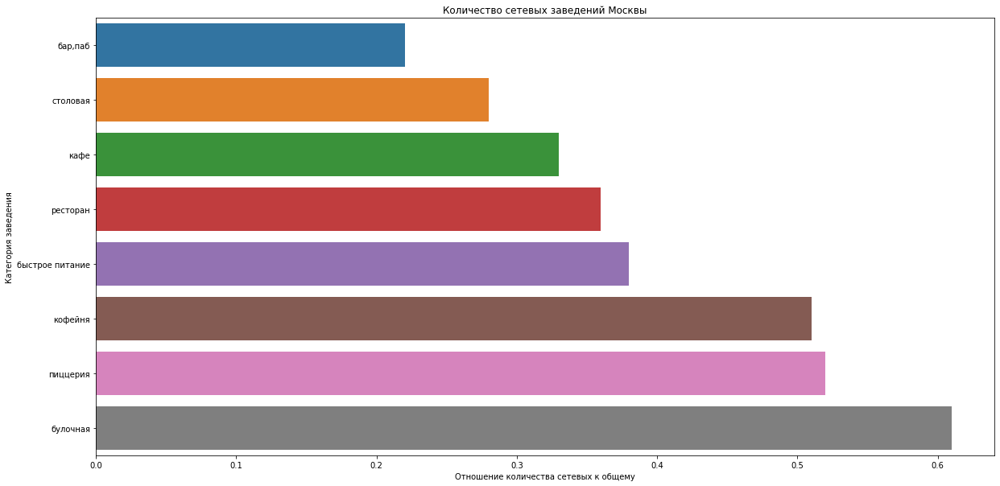

In [21]:
f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data=chains_rate, x='rate', y=chains_rate.index)

ax.set_ylabel('Категория заведения')
ax.set_xlabel('Отношение количества сетевых к общему')
ax.set_title('Количество сетевых заведений Москвы')
#plt.xticks(rotation=45)
#ann(ax,chains_rate['rate'])
plt.show()

Самое большое число сетевых заведений в категории "булочная", а также "пиццерия" и "кофейня", а меньше всего - "бар,паб" и "столовая"

In [22]:
chains_name = places600.groupby('name').agg({'rating' : 'mean', 'category' : pd.Series.mode, 'address' : 'count', 'chain' : 'sum'}).round(1)
chains_name = chains_name.rename(columns={'category': 'category','address':'cnt', 'chain':'ch'})
chains_name = chains_name[chains_name['ch'] != 0] # уберем точно не сетевые, например Шаурма или Кафе

top15 = chains_name.sort_values(by='cnt', ascending=False).reset_index().head(15)

top15

,name,rating,category,cnt,ch
0,Шоколадница,4.2,кофейня,118,118
1,Домино'с Пицца,4.2,пиццерия,76,76
2,Додо Пицца,4.3,пиццерия,74,74
3,One Price Coffee,4.1,кофейня,70,70
4,Яндекс Лавка,3.9,ресторан,68,68
5,Cofix,4.1,кофейня,65,65
6,Prime,4.1,ресторан,50,50
7,Хинкальная,4.3,кафе,44,44
8,КОФЕПОРТ,4.1,кофейня,42,42
9,Теремок,4.1,ресторан,38,38


In [23]:
all_points = chains.groupby('category')['count'].sum().reset_index()
all_points.columns = ['category','total']
top15 = top15.merge(all_points, on='category', how='left')
top15['part'] = (top15['cnt'] / top15['total']).round(3)
top15

,name,rating,category,cnt,ch,total,part
0,Шоколадница,4.2,кофейня,118,118,1401,0.084
1,Домино'с Пицца,4.2,пиццерия,76,76,629,0.121
2,Додо Пицца,4.3,пиццерия,74,74,629,0.118
3,One Price Coffee,4.1,кофейня,70,70,1401,0.050
4,Яндекс Лавка,3.9,ресторан,68,68,2031,0.033
5,Cofix,4.1,кофейня,65,65,1401,0.046
6,Prime,4.1,ресторан,50,50,2031,0.025
7,Хинкальная,4.3,кафе,44,44,2366,0.019
8,КОФЕПОРТ,4.1,кофейня,42,42,1401,0.030
9,Теремок,4.1,ресторан,38,38,2031,0.019


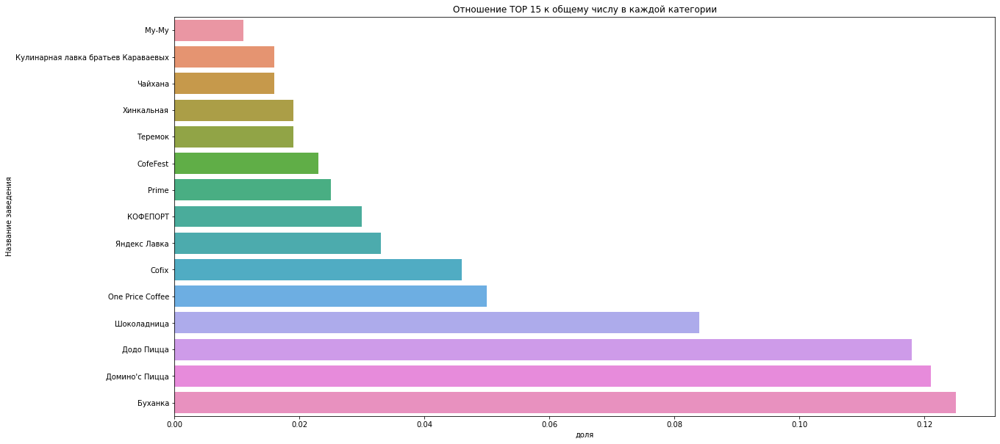

In [24]:
f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data=top15.sort_values(by='part'), x='part', y='name')

ax.set_ylabel('Название заведения')
ax.set_xlabel('доля')
ax.set_title('Отношение TOP 15 к общему числу в каждой категории')
#plt.xticks(rotation=45)
#ann(ax,chains_rate['rate'])
plt.show()

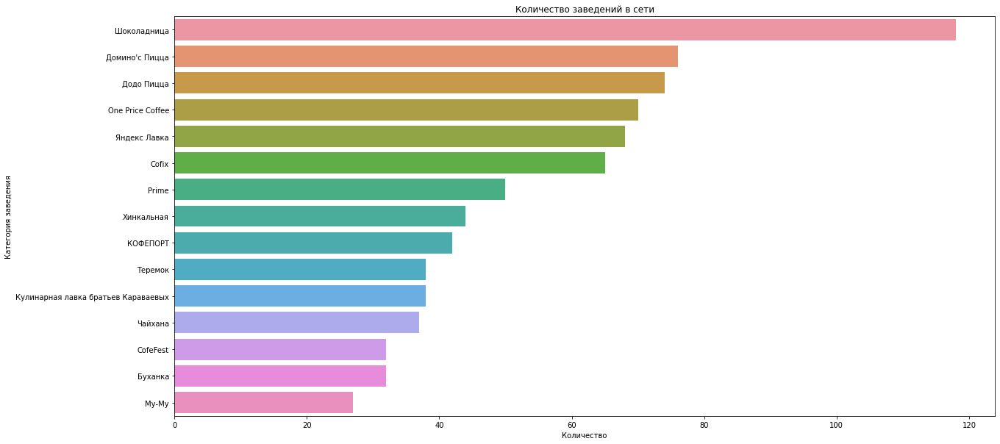

In [25]:
f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data=top15, y='name', x='cnt')

ax.set_ylabel('Категория заведения')
ax.set_xlabel('Количество')
ax.set_title('Количество заведений в сети')
#plt.yticks(rotation=40)
#ann(ax,top15['cnt'])
plt.show()

### Промежуточный вывод
Не сетевых заведений в Москве больше -68% против 32% сетевых. 

Больше всего доля сетей в заведениях: булочная (61%), пиццерия (52%), кофейня (51%).

Хотя заведений категории: кафе(2366), ресторан (2031), кофейни(1401) больше всего в Москве.

По посадочным местам лидируют, как и ожидалось, рестораны - в среднем 117, на последнем месте пиццерии - 90 мест. Что тоже ожидаемо, так как пиццерии в основном ориентированы на доставку по району, где они находятся.

Самая многочисленная сеть - кафе Шоколадница - 118 заведений. Второе и третье место - Домино'с Пицца (76) и Додо Пицца (74). Практически все сети из Top-15 - это франшизы и развиваются не за счет открытия собственных заведений, а партнерских. Причем, Шоколадница одна из самых старых сетей ,поэтому у них и больше всего кафе.
*Я ее помню еще, когда училась в институте(в 90е пешком ходили от университета (керосинки) на Октябрьскую в день стипендии)*
Додо и Доминос' Пиццы - это очень активные франчайзи-сети, которые продаются и открываются и в этом году, и, кстати, активно продвигаются в регионы, а не только в Москве.

В отличие от всех франшиз, Кулинарная лавка братьев Караваевых(37 заведений) развивается за счет открытия собственных точек.

Больше всего представлено сетевых лидеров среди кофеен - 5, следующая категория - кафе - 4, потом рестораны - 3, пиццерии - 2 и булочные -1. 
Это и понятно, в Москве уже довольно давно бум кофе, его пьют по дороге на работу, в метро, на работе, так что все эти запросы бизнес закрывает. А кафе - это хорошее сборное название, когда не знаешь как определить категорию своего заведения, то назови его кафе и не прогадаешь. 

Пиццерии бурно развиваются еще и из-за того, что в пакет франчайзи включено программное обеспечение, которое позволяет настроить получение заказов от клиентов и их доставку, а также отслеживать наличие продуктов на точке, своевременный их закуп и составление графика работы персонала и т.п.

Рынок Москвы общепита большой и будет развиваться.

### Посмотрим по районам Москвы

In [26]:
print('Всего заведений общепита в каждом районе МОсквы:\n')
dist = places600['district'].value_counts(sort=True)
print(dist)


Всего заведений общепита в каждом районе МОсквы:

Центральный административный округ         2242
Южный административный округ                891
Северо-Восточный административный округ     891
Северный административный округ             877
Западный административный округ             831
Восточный административный округ            791
Юго-Восточный административный округ        714
Юго-Западный административный округ         707
Северо-Западный административный округ      409
Name: district, dtype: int64


Не представлены Зеленоградский, Новомосковский и Троицкий округа. По всей видимости, из-за отдаленности (оторванности) от основной Москвы.

In [27]:
district = places600.groupby(['district', 'category']).agg({'name' : 'count', 'rating' : 'median', 'seats' : 'median', 'chain' : 'sum'}).reset_index()
district = district.rename(columns={'name':'cnt', 'chain':'ch'})
district=district.sort_values(by='cnt', ascending=False)
district.head()

,district,category,cnt,rating,seats,ch
46,Центральный административный округ,ресторан,670,4.4,36.0,217
43,Центральный административный округ,кафе,464,4.3,5.0,218
44,Центральный административный округ,кофейня,428,4.3,4.0,221
40,Центральный административный округ,"бар,паб",364,4.5,29.5,73
51,Юго-Восточный административный округ,кафе,282,4.2,0.0,80


In [28]:
all_districts = district.groupby('district')['cnt'].sum().reset_index()
all_districts.columns = ['district','total']
all_districts
district = district.merge(all_districts, on='district', how='left')
district['rate']=(district['cnt']/district['total']).round(2)
district = district.sort_values(by='total', ascending=False)
district

,district,category,cnt,rating,seats,ch,total,rate
0,Центральный административный округ,ресторан,670,4.4,36.0,217,2242,0.30
49,Центральный административный округ,булочная,50,4.4,35.0,39,2242,0.02
28,Центральный административный округ,быстрое питание,87,4.3,10.0,34,2242,0.04
1,Центральный административный округ,кафе,464,4.3,5.0,218,2242,0.21
40,Центральный административный округ,столовая,66,4.3,0.0,25,2242,0.03
...,...,...,...,...,...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23,4.4,85.0,2,409,0.06
68,Северо-Западный административный округ,столовая,18,4.2,0.0,3,409,0.04
24,Северо-Западный административный округ,ресторан,109,4.3,70.0,37,409,0.27
22,Северо-Западный административный округ,кафе,115,4.2,8.0,35,409,0.28


In [29]:
fig = px.bar(district.sort_values(by='rate', ascending=False), 
             y='district',
             x='rate', 
             color='category',
             text='rate'
             )

fig.update_layout(title='Доля заведений по округам от общего количества заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административный округ Москвы',
                   barmode='relative'
                 )

fig.show() 

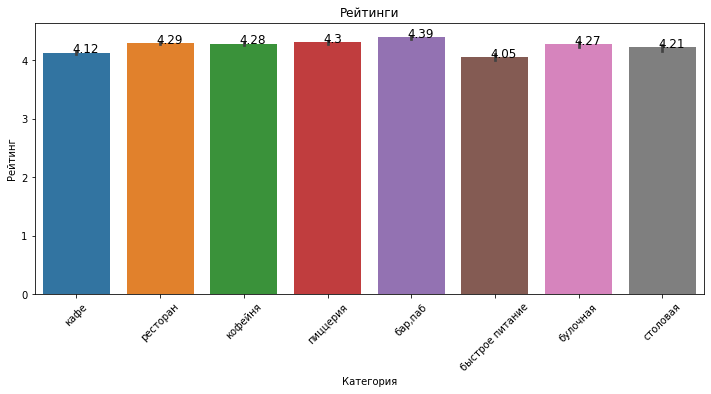

In [30]:
f, ax = plt.subplots(figsize=(12, 5))

ax = sns.barplot(data=places600, x='category', y='rating', estimator=np.mean)
ax.set_xlabel('Категория')
ax.set_ylabel('Рейтинг')
ax.set_title('Рейтинги')
plt.xticks(rotation=45)

ann(ax,district['rating'])
plt.show()



Самый высокий рейтинг у баров\пабов - 4.39, самый низкий у быстрого питания - 4.05.

In [31]:
rating_df = places600.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values(by='rating', ascending=False)
rating_df

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [32]:
fig = px.bar(rating_df, 
             y='district',
             x='rating', 
             
             text='rating')

fig.update_layout(title='Рейтинги по округам',
                   yaxis_title='Округ',
                   xaxis_title='Рейтинг',
                   yaxis={'categoryorder':'total descending'},
                   barmode='relative'
                 )

fig.show() 

### промежуточный вывод

В наших данных присутствуют 9 округов Москвы, не представлены Зеленоградский, Новомосковский и Троицкий округа.

Больше всего заведений в Центральном административном округе - 2242, в том числе ресторанов 640, кафе - 464, кофеен - 428.
Меньше всего в Северо-западном ао - 409, здесь преобладают кафе - 115.

Самый большой средний рейтинг у пабов - 4.4, самый низкий у быстрого питания - 4.1. Но это и понятно, обычно, места, где предоставляется возможность спокойно посидеть, люди и приходят настроенные на отдых и получение удовольствия, а в точках быстрого питания им нужна быстрота, которая иногда выливается в ухудшение качества.
Поэтому и в ЦАО самые большие средние рейтинги, так как здесь наибольшая концентрация заведений для отдыха, а не для еды на бегу.



 ### Тепловая карта рейтингов заведений по районам Москвы 

In [33]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

### Карта с маркерами заведений общественного питания г. Москва


In [34]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

from folium.features import CustomIcon
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m2)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon_url = 'https://img.icons8.com/ultraviolet/2x/restaurant-building.png'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m2

### ТОП-15 улиц по количеству заведений

In [35]:
street = places600.groupby('street').agg({'name' : 'count', 'seats' : 'median'})
street = street.rename(columns={'name':'cnt', 'seats':'s_cnt'})
street
top15_street = street.sort_values(by='cnt', ascending=False).reset_index().head(15)

top15_street

,street,cnt,s_cnt
0,проспект Мира,184,0.0
1,Профсоюзная улица,122,75.0
2,Ленинский проспект,107,64.0
3,проспект Вернадского,97,50.0
4,Дмитровское шоссе,88,55.0
5,Каширское шоссе,77,40.0
6,Варшавское шоссе,76,20.0
7,Ленинградский проспект,72,65.0
8,Ленинградское шоссе,70,49.0
9,МКАД,65,0.0


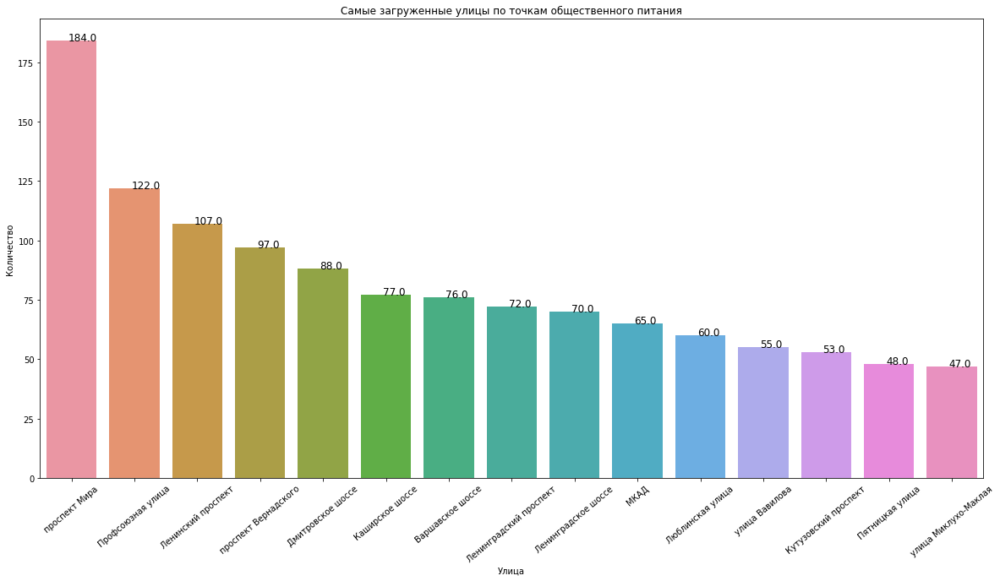

In [36]:
f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data=top15_street, x='street', y='cnt')

ax.set_xlabel('Улица')
ax.set_ylabel('Количество')
ax.set_title('Самые загруженные улицы по точкам общественного питания')
plt.xticks(rotation=40)
ann(ax,top15_street['cnt'])
plt.show()

Самое большое количество заведений на проспекте Мира, наверное, это сочетание факторов: длина улицы около 9 км, проходит через большое количество спальных районов, на ней размещено много офисных центров и учреждений и начинается она от Садового кольца, и проходит частично через Центральный округ, где как мы видели самая большая концентрация мест общепита.

Самое маленькое число заведений на улице из ТОП-15 на ул. Миклухо-Маклая. Небольшая улица на Юго-западе Москвы (почти 4 км), но на ней несколько больших учебных заведений

In [37]:
street_cat = places600.groupby(['street', 'category']).agg({'name' : 'count'}).reset_index()
street_cat = street_cat.rename(columns={'name':'cnt_cat'})
street_cat15 = street_cat[street_cat['street'].isin(top15_street['street'])]

street_cat = street_cat.rename(columns={'name':'cnt_cat'})
street_cat = street_cat.sort_values(by='cnt_cat', ascending=False)
street_cat15 

,street,category,cnt_cat
683,Варшавское шоссе,"бар,паб",6
684,Варшавское шоссе,быстрое питание,7
685,Варшавское шоссе,кафе,18
686,Варшавское шоссе,кофейня,14
687,Варшавское шоссе,пиццерия,4
...,...,...,...
3433,улица Миклухо-Маклая,быстрое питание,4
3434,улица Миклухо-Маклая,кафе,20
3435,улица Миклухо-Маклая,кофейня,4
3436,улица Миклухо-Маклая,пиццерия,2


In [38]:
fig = px.bar(street_cat15, 
             y='street',
             x='cnt_cat', 
             color='category',
             text='cnt_cat')

fig.update_layout(title='15 самых загруженных улиц по категориям заведений',
                   yaxis_title='Количество заведений',
                   xaxis_title='улица',
                   yaxis={'categoryorder':'total descending'},
                   barmode='relative'
                 )

fig.show() 

На проспекте Мира больше всего кафе - 53, а меньше всего столовых - 2 и булочных -4. На самой маленькой по количеству мест питания улице Миклухо-Маклая также большая часть кафе (20 штук) ,но булочных и столовых нет, вообще.

### Улицы, где только 1 заведение общественного питания

In [39]:
street_only1 = places600.groupby('street')['name'].count().sort_values(ascending=True).reset_index().query('name == 1')

street_only1 = street_only1.merge(places600, on='street', how='left')
display(street_only1.head())
display(street_only1.info())

,street,name_x,name_y,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
0,1-й Автозаводский проезд,1,Чайхана Азия,кафе,"Москва, 1-й Автозаводский проезд, 5",Южный административный округ,"ежедневно, круглосуточно",55.704847,37.657065,4.2,средние,Средний счёт:190–350 ₽,270.0,NaN,1,20,True
1,Одинцовская улица,1,Монастырская трапеза,столовая,"Москва, Одинцовская улица, 24с18",Северо-Западный административный округ,"ежедневно, 09:00–20:00",55.790620,37.405720,4.5,NaN,0,0.0,NaN,1,0,False
2,Октябрьский переулок,1,Кампа,ресторан,"Москва, Октябрьский переулок, 12",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.787258,37.612063,4.1,средние,Средний счёт:800 ₽,800.0,NaN,0,48,False
3,Ордынский тупик,1,ABC Coffee Roasters,кофейня,"Москва, Ордынский тупик, 4А",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.741026,37.623384,4.5,NaN,0,0.0,NaN,1,0,False
4,Оренбургская улица,1,Шаурамус,кафе,"Москва, Оренбургская улица, 18",Восточный административный округ,"ежедневно, 09:00–21:00",55.712535,37.862657,3.0,NaN,0,0.0,NaN,0,0,False


<class 'pandas.core.frame.DataFrame'>
Int64Index: 458 entries, 0 to 457
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   street             458 non-null    object 
 1   name_x             458 non-null    int64  
 2   name_y             458 non-null    object 
 3   category           458 non-null    object 
 4   address            458 non-null    object 
 5   district           458 non-null    object 
 6   hours              431 non-null    object 
 7   lat                458 non-null    float64
 8   lng                458 non-null    float64
 9   rating             458 non-null    float64
 10  price              182 non-null    object 
 11  avg_bill           458 non-null    object 
 12  middle_avg_bill    458 non-null    float64
 13  middle_coffee_cup  24 non-null     float64
 14  chain              458 non-null    int64  
 15  seats              458 non-null    int64  
 16  is_24/7            431 non

None

Одиночные заведения по категориям:
 кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64


<AxesSubplot:ylabel='name_y'>

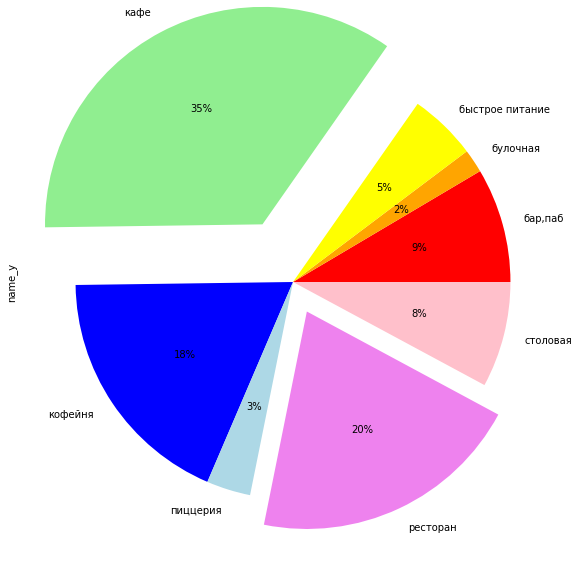

In [40]:
print('Одиночные заведения по категориям:\n', street_only1['category'].value_counts(sort=True))

explode = (0, 0, 0, 0.3, 0, 0, 0.15, 0)
colors = ( "red", "orange", "yellow", 
          "lightgreen", "blue", "lightblue", "violet", "pink") 
street_only1.groupby('category')['name_y'].count().plot(kind='pie', y='category', autopct='%1.0f%%', figsize=(15, 10), explode=explode, colors=colors)


распределение по сетям:
 0    325
1    133
Name: chain, dtype: int64


<AxesSubplot:ylabel='name_y'>

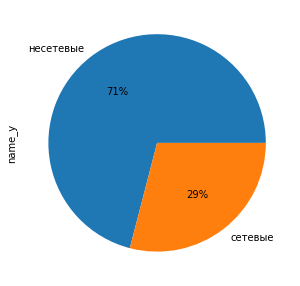

In [41]:
print('распределение по сетям:\n', street_only1['chain'].value_counts(sort=True))
street_only1.groupby('chain')['name_y'].count().plot(kind='pie', y='chain', autopct='%1.0f%%', figsize=(10, 5), labels=['несетевые', 'сетевые'])

круглосуточная работа:
 False    400
True      31
Name: is_24/7, dtype: int64


<AxesSubplot:ylabel='name_y'>

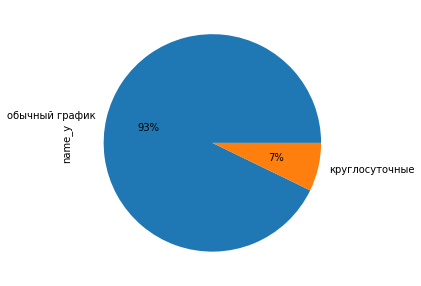

In [42]:
print('круглосуточная работа:\n', street_only1['is_24/7'].value_counts(sort=True))
street_only1.groupby('is_24/7')['name_y'].count().plot(kind='pie', y='is_24/7', autopct='%1.0f%%', figsize=(10, 5), labels=['обычный график', 'круглосуточные'])

округа:
 Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64


<AxesSubplot:ylabel='name_y'>

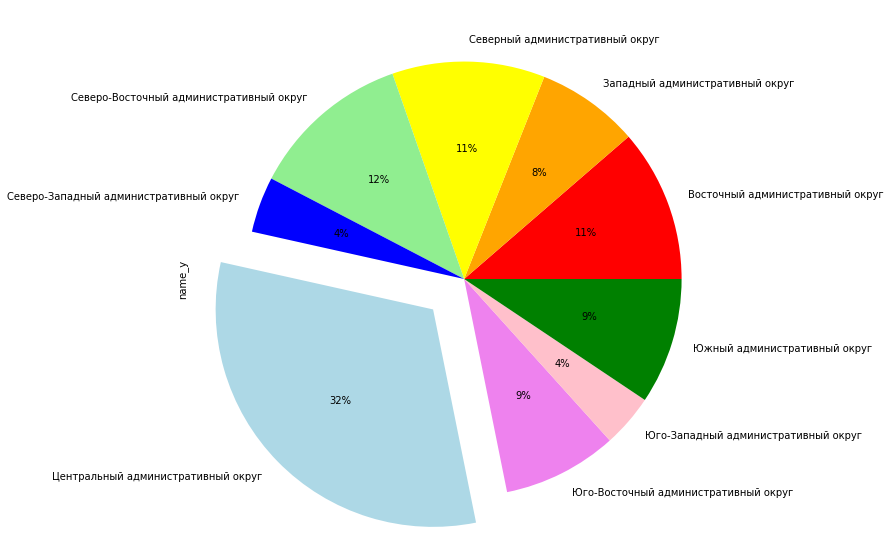

In [43]:
print('округа:\n', street_only1['district'].value_counts(sort=True))
explode = (0, 0, 0, 0, 0, 0.2, 0, 0, 0)
colors = ( "red", "orange", "yellow", 
          "lightgreen", "blue", "lightblue", "violet", "pink", "green") 
street_only1.groupby('district')['name_y'].count().plot(kind='pie', y='district', autopct='%1.0f%%', figsize=(15, 10), explode=explode, colors=colors)

In [44]:
district_only1 = street_only1.groupby('district')['street'].count().sort_values(ascending=False).reset_index()
district_only1 = district_only1.rename(columns={'street':'count'})
district_only1


,district,count
0,Центральный административный округ,145
1,Северо-Восточный административный округ,55
2,Восточный административный округ,52
3,Северный административный округ,52
4,Южный административный округ,43
5,Юго-Восточный административный округ,39
6,Западный административный округ,35
7,Северо-Западный административный округ,19
8,Юго-Западный административный округ,18


In [45]:
fig = px.bar(district_only1, 
             y='district',
             x='count', 
             text='count',                   
             )

fig.update_layout(title='Количество улиц с 1 заведением по округам',
                   yaxis_title='Округ',
                   xaxis_title='Количество заведений',
                   xaxis={'categoryorder':'total descending'}
                 )
fig.show() 

Всего 458 улиц с одним заведением общепита. Из них 160 - это кафе. А также 325 - несетевых и 133 - сетевых. Круглосуточно работает из них только - 31. Большинство - 145 - находятся в Центральном административном округе.

### Построим картограмму Среднего чека по районам

In [46]:

median_bill_district=places.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
print(median_bill_district)

                                  district  middle_avg_bill
0          Западный административный округ           1000.0
1       Центральный административный округ           1000.0
2   Северо-Западный административный округ            700.0
3          Северный административный округ            650.0
4      Юго-Западный административный округ            600.0
5         Восточный административный округ            575.0
6  Северо-Восточный административный округ            500.0
7             Южный административный округ            500.0
8     Юго-Восточный административный округ            450.0


In [47]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    #fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m3)

# выводим карту
m3

Самый высокий средний чек в ЦАО и Западном ао (где проходят Кутузовский проспект и Рублевское шоссе). Традиционно - самые дорогие районы Москвы. Самый низкий чек - в Юго-восточном ао. Средний чек понижается при отходе от центра, кроме Западного АО, как я уже и отмечала, это из-за престижности района и нахождения там магистралей, которые ведут в элитные районы застройки Подмосковья.

### Посмотрим на график работы

круглосуточная работа:
 False    7097
True      727
Name: is_24/7, dtype: int64


<AxesSubplot:ylabel='name'>

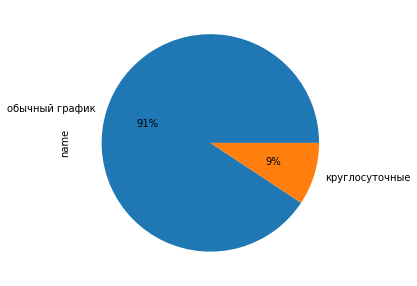

In [48]:
print('круглосуточная работа:\n', places600['is_24/7'].value_counts(sort=True))
places600.groupby('is_24/7')['name'].count().plot(kind='pie', y='is_24/7', autopct='%1.0f%%', figsize=(10, 5), labels=['обычный график', 'круглосуточные'])

In [49]:
cat_is = places600.groupby(['category', 'is_24/7']).agg({'name' : 'count'}).reset_index()

cat_is = cat_is.rename(columns={'name':'cnt'})
print(cat_is)

fig = px.bar(cat_is, 
             y='category',
             x='cnt', 
             color='is_24/7',
             text='cnt')

fig.update_layout(title='Число круглосуточных заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='категория',
                   barmode='relative',
                   yaxis={'categoryorder':'total descending'}
                 )

fig.show() 

           category  is_24/7   cnt
0           бар,паб    False   687
1           бар,паб     True    52
2          булочная    False   224
3          булочная     True    24
4   быстрое питание    False   419
5   быстрое питание     True   150
6              кафе    False  1729
7              кафе     True   266
8           кофейня    False  1327
9           кофейня     True    59
10         пиццерия    False   593
11         пиццерия     True    31
12         ресторан    False  1826
13         ресторан     True   133
14         столовая    False   292
15         столовая     True    12


In [50]:
cat_is_rate = places600.pivot_table(index='category', values = 'name', columns = 'is_24/7', aggfunc='count')
cat_is_rate['total']=cat_is_rate[0]+cat_is_rate[1]
cat_is_rate['rate']=(cat_is_rate[1]/cat_is_rate['total']).round(2)
cat_is_rate = cat_is_rate.sort_values(by='rate')
cat_is_rate.columns = ['is0', 'is1', 'total', 'rate']
display(cat_is_rate)

,is0,is1,total,rate
category,,,,
кофейня,1327,59,1386,0.04
столовая,292,12,304,0.04
пиццерия,593,31,624,0.05
"бар,паб",687,52,739,0.07
ресторан,1826,133,1959,0.07
булочная,224,24,248,0.10
кафе,1729,266,1995,0.13
быстрое питание,419,150,569,0.26


In [51]:
fig = px.bar(cat_is_rate, 
             y=cat_is_rate.index,
             x='rate', 
             text='rate',
             color_discrete_sequence=["blue"])

fig.update_layout(title='Доля круглосуточных заведений по категориям',
                   xaxis_title='Доля круглосуточных',
                   yaxis_title='категория',
                   barmode='relative',
                   yaxis={'categoryorder':'total descending'}
                 )

fig.show() 

In [52]:
dis_is = places600.groupby(['district', 'is_24/7']).agg({'name' : 'count'}).reset_index()
dis_is = dis_is.rename(columns={'name':'cnt'}).sort_values(by='cnt', ascending=False)

dis_is

,district,is_24/7,cnt
10,Центральный административный округ,False,2080
6,Северо-Восточный административный округ,False,755
4,Северный административный округ,False,753
16,Южный административный округ,False,752
2,Западный административный округ,False,699
0,Восточный административный округ,False,621
14,Юго-Западный административный округ,False,575
12,Юго-Восточный административный округ,False,536
8,Северо-Западный административный округ,False,326
11,Центральный административный округ,True,131


In [53]:
fig = px.bar(dis_is, 
             x='district',
             y='cnt', 
             color='is_24/7',
             text='cnt')

fig.update_layout(title='Количество круглосуточных заведений по округам',
                   yaxis_title='Количество заведений',
                   xaxis_title='Административный округ Москвы',
                   barmode='relative'
                 )

fig.show() 

Заведений, которые работают круглосуточно, не очень много - 9%. Больше всего таких заведений в количественном отношении среди кафе - 266 штук, а вот в абсолютном - самый большой процент круглосуточных заведений среди завдений быстрого питания - 26%. И больше всего круглосуточных заведений в Центральном округе - 131, а меньше всего в Северо-западеном округе - 43.

## Вывод

Были представлены данные по 9 округам г. Москвы по 8469 заведениям общественного питания в 8ми категориях: кафе, ресторан, кофейня, бар,паб, пиццерия, быстрое питание, столовая, булочная. 

Больше всего - 28% - это кафе, меньше всего - булочных - 3% от общего числа мест.

Самое большое среднее число посадочных мест имеют рестораны -117 мест, меньше всего в пиццериях. Это явление объясняется назначением этих заведений.

Несетевых заведений в Москве -62% - больше, чем тех, кто принадлежит каким-то сетям. Самое большое соотношение сетевых заведений в категории - булочная, а меньше всего у бар\пабов. Самая многочисленная сеть - кафе Шоколадница - 118 заведений. Среди всех сетевых заведений - только "Кулинарная лавка братьев Караваевых" не является франшизой, остальные развиваются за счет партнерской программы.
Самая большая концентрация мест общественного питания в Центральном академическом округе, в том числе ресторанов 640, кафе - 464, кофеен - 428. Меньше всего в Северо-западном ао - 409, здесь преобладают кафе - 115.

Самый большой средний рейтинг у пабов - 4.4, самый низкий у быстрого питания - 4.1. В ЦАО самые большие средние рейтинги, так как здесь наибольшая концентрация заведений для отдыха, а не для еды на бегу.
Больше всего заведений находятся на проспекте Мира - 184, там больше всего кафе - 53, а меньше всего столовых - 2 и булочных -4. На самой маленькой по количеству мест питания улице Миклухо-Маклая также большая часть кафе (20 штук) ,но булочных и столовых нет, вообще.

458 улиц всего с одним заведением общепита. Из них 160 - это кафе. А также 325 - несетевых и 133 - сетевых. Круглосуточно работает из них только - 31. Большинство - 145 - находятся в Центральном административном округе.

Самый высокий средний чек в ЦАО и Западном ао. Самый низкий чек - в Юго-восточном ао. Средний чек понижается при отходе от центра, кроме Западного АО, как я уже и отмечала, это из-за престижности района и нахождения там магистралей, которые ведут в элитные районы застройки Подмосковья.

Заведений, которые работают круглосуточно, не очень много - 9%. Больше всего таких заведений в количественном отношении среди кафе - 266 штук, а вот в абсолютном - самый большой процент круглосуточных заведений среди завдений быстрого питания - 26%. И больше всего круглосуточных заведений в Центральном округе - 131, а меньше всего в Северо-западеном округе - 43.

## Исследования для открытия кофейни, типа "Друзья"

### Кофейни

In [54]:
cafes = places600[places600['category'] == "кофейня"]
print(cafes.info())
print(cafes.describe())
cafes.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1401 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1401 non-null   object 
 1   category           1401 non-null   object 
 2   address            1401 non-null   object 
 3   district           1401 non-null   object 
 4   hours              1386 non-null   object 
 5   lat                1401 non-null   float64
 6   lng                1401 non-null   float64
 7   rating             1401 non-null   float64
 8   price              472 non-null    object 
 9   avg_bill           1401 non-null   object 
 10  middle_avg_bill    1401 non-null   float64
 11  middle_coffee_cup  515 non-null    float64
 12  chain              1401 non-null   int64  
 13  seats              1401 non-null   int64  
 14  street             1401 non-null   object 
 15  is_24/7            1386 non-null   object 
dtypes: float64(5), int64(2),

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,0.0,170.0,0,0,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,0,0.0,NaN,1,0,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,0,0.0,NaN,1,46,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,0,0.0,NaN,1,0,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,0,0.0,NaN,1,0,улица Дыбенко,False


 Всего 1401 кофеен в датасете. Средний рейтинг кофеен - 4.3. Средняя стоимость чашки кофе - 175 руб. (медианная - 170), есть странные выбросы по стоимости чашки кофе - 1568 максимальная. Среднее число посадочных мест - 52, а медианная - 5, что ближе к особенности кофеен. Потому что последнее время очень много кофеен открывалось в формате: кофе на вынос, с очень небольшим количеством сидячих мест.

In [55]:

cafes['middle_coffee_cup'] = cafes['middle_coffee_cup'].fillna(0)
cafes['avg_bill'] = cafes['avg_bill'].fillna(0)
cafes1=cafes[cafes['middle_coffee_cup'] == 0]
cafes1=cafes1[cafes1['avg_bill'] != 0]
display(cafes1)
cafes1[cafes1['avg_bill'].str.contains(r'ена(?!$)')] # смотрим что осталось со словами Цена или цена (*ена*)

/tmp/ipykernel_97/1853269800.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_97/1853269800.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,0.0,1,0,Угличская улица,False
139,Шеф Бургер,кофейня,"Москва, Дмитровское шоссе, 116Д",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.901734,37.548499,4.1,средние,Средний счёт:300 ₽,300.0,0.0,1,120,Дмитровское шоссе,False
254,Ай Эм Конфидент,кофейня,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.875832,37.665830,4.2,средние,Средний счёт:350–500 ₽,425.0,0.0,0,100,Староватутинский проезд,False
279,Сладкие минуты,кофейня,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.875692,37.665722,3.9,NaN,Средний счёт:260–300 ₽,280.0,0.0,0,100,Староватутинский проезд,False
299,Калитки,кофейня,"Москва, Фестивальная улица, 13, корп. 2",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.856284,37.476017,4.5,средние,Средний счёт:300–500 ₽,400.0,0.0,1,90,Фестивальная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8052,Lavburger,кофейня,"Москва, Судостроительная улица, 32, корп. 1, с...",Южный административный округ,пн-чт 09:00–22:00; пт 09:00–23:00; сб 10:00–23...,55.683534,37.685922,4.7,средние,Средний счёт:350–500 ₽,425.0,0.0,0,300,Судостроительная улица,False
8170,Вкусные пончики Ля Пон Пон,кофейня,"Москва, Судостроительная улица, 23, корп. 1",Южный административный округ,"ежедневно, 10:00–19:00",55.682097,37.677326,4.3,низкие,Средний счёт:100–200 ₽,150.0,0.0,0,300,Судостроительная улица,False
8194,Корифей,кофейня,"Москва, 2-й Южнопортовый проезд, 14/22с3",Юго-Восточный административный округ,"ежедневно, 07:00–20:00",55.704082,37.691607,3.5,средние,Средний счёт:250–350 ₽,300.0,0.0,0,0,2-й Южнопортовый проезд,False
8298,Кофея,кофейня,"Москва, Тарханская улица, 1",Юго-Восточный административный округ,"ежедневно, 08:00–22:00",55.685427,37.858177,4.8,низкие,Средний счёт:70–200 ₽,135.0,0.0,0,0,Тарханская улица,False


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7


Там где в столбце avg_bill стоит Цена чашки кофе/каппучино, столбец middle_coffee_cup	 - заполнен. А там где в столбце avg_bill осталась запись средний счет - невозможно понять - это средняя цена чашки капуччино или общего счета, например, с десертом. Так что оставим данные как есть.

In [56]:
cafes.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,0.0,170.0,0,0,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,0,0.0,0.0,1,0,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,0,0.0,0.0,1,46,Коровинское шоссе,False
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,0,0.0,0.0,1,0,улица Маршала Федоренко,False
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,0,0.0,0.0,1,0,улица Дыбенко,False


### Посмотрим на месторасположение кофеен

Всего кофеен в каждом районе МОсквы:

                                  district  cnt
0       Центральный административный округ  428
1          Северный административный округ  186
2  Северо-Восточный административный округ  159
3          Западный административный округ  146
4             Южный административный округ  131
5         Восточный административный округ  104
6      Юго-Западный административный округ   96
7     Юго-Восточный административный округ   89
8   Северо-Западный административный округ   62


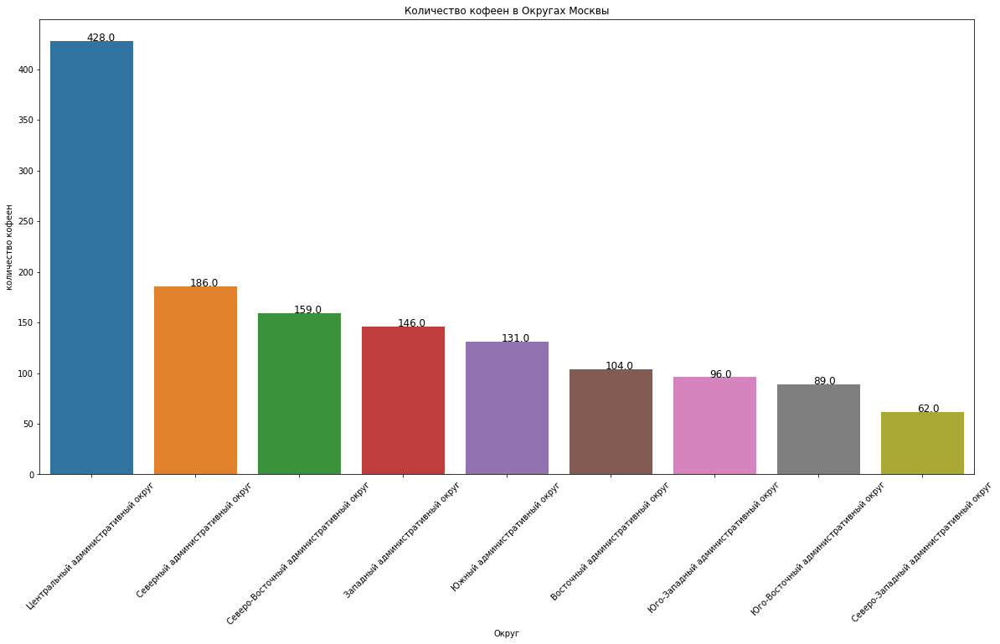

In [57]:
cafes_district = cafes.groupby(['district']).agg({'name' : 'count'})
cafes_district = cafes_district.rename(columns={'name':'cnt'})
cafes_district = cafes_district.sort_values(by = 'cnt', ascending = False).reset_index()
print('Всего кофеен в каждом районе МОсквы:\n')
print(cafes_district)

f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data=cafes_district, x='district', y='cnt')

ax.set_xlabel('Округ')
ax.set_ylabel('количество кофеен')
ax.set_title('Количество кофеен в Округах Москвы')
plt.xticks(rotation=45)
ann(ax,cafes_district['cnt'])
plt.show()

In [58]:
cup=cafes.query('middle_coffee_cup !=0').groupby('district')['middle_coffee_cup'].median(2).sort_values(ascending=False).reset_index()



In [59]:
cafes_district =  cafes_district.merge(cup, on='district', how='left')
cafes_district = cafes_district.rename(columns={'middle_coffee_cup':'median_cup'})
cafes_district

,district,cnt,median_cup
0,Центральный административный округ,428,190.0
1,Северный административный округ,186,159.0
2,Северо-Восточный административный округ,159,162.5
3,Западный административный округ,146,187.0
4,Южный административный округ,131,150.0
5,Восточный административный округ,104,135.0
6,Юго-Западный административный округ,96,198.0
7,Юго-Восточный административный округ,89,147.5
8,Северо-Западный административный округ,62,165.0


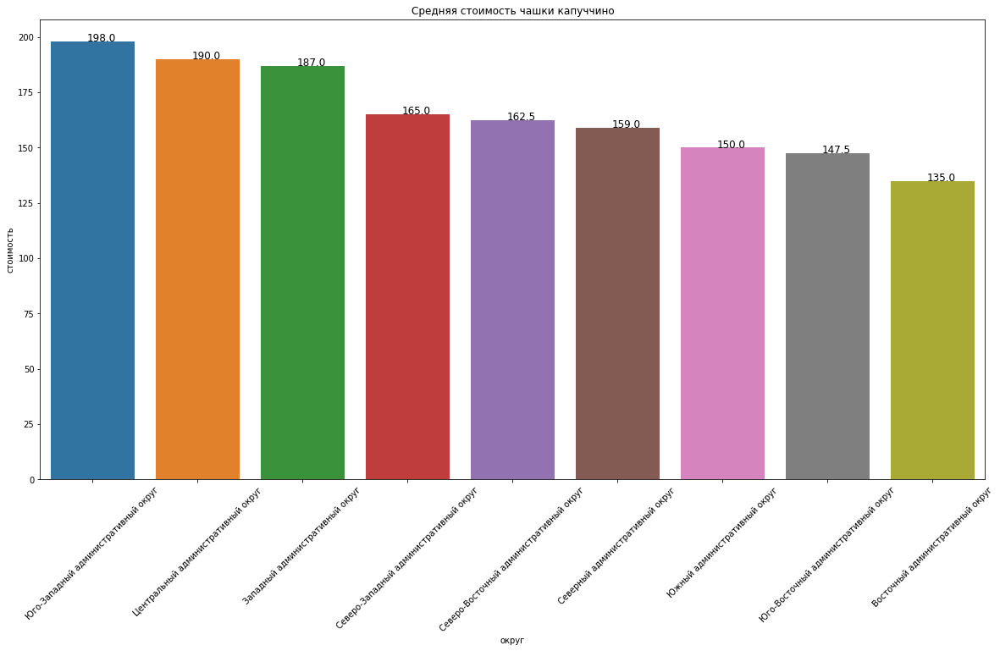

In [60]:
cafes_district = cafes_district.sort_values(by='median_cup', ascending=False)

f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data=cafes_district, x='district', y='median_cup')

ax.set_xlabel('округ')
ax.set_ylabel('стоимость')
ax.set_title('Средняя стоимость чашки капуччино')
plt.xticks(rotation=45)
ann(ax,cafes_district['median_cup'])
plt.show()

In [61]:
cafes_street = cafes.groupby(['street']).agg({'name' : 'count'})
cafes_street = cafes_street.rename(columns={'name':'cnt'})
cafes_street = cafes_street.sort_values(by = 'cnt', ascending = False).reset_index()
print(cafes_street.head(20))


                    street  cnt
0            проспект Мира   36
1       Ленинский проспект   23
2        Профсоюзная улица   18
3   Ленинградский проспект   18
4          Каширское шоссе   16
5     проспект Вернадского   14
6         Варшавское шоссе   14
7     Кутузовский проспект   13
8     Новослободская улица   13
9      Ленинградское шоссе   13
10   Новодмитровская улица   12
11        Люблинская улица   11
12       Дмитровское шоссе   11
13          улица Вавилова   10
14  Волгоградский проспект    9
15         Бутырская улица    9
16      Алтуфьевское шоссе    9
17        Береговой проезд    9
18         Ярцевская улица    8
19       Головинское шоссе    8


In [62]:
cup2=cafes.query('middle_coffee_cup !=0').groupby('street')['middle_coffee_cup'].median(2).sort_values(ascending=False).reset_index()
cup2

,street,middle_coffee_cup
0,Большая Семёновская улица,851.0
1,Большая Никитская улица,328.0
2,3-я Фрунзенская улица,320.0
3,Большая Сухаревская площадь,300.0
4,Богословский переулок,300.0
...,...,...
334,Шипиловский проезд,60.0
335,улица Измайловский Вал,60.0
336,улица Барклая,60.0
337,улица Декабристов,60.0


In [63]:
cafes_street = cafes_street.merge(cup2, on='street', how='left')
cafes_street = cafes_street.rename(columns={'middle_coffee_cup':'median_cup'})
top_street = cafes_street.head(20)
print(top_street)


                    street  cnt  median_cup
0            проспект Мира   36       220.0
1       Ленинский проспект   23       227.0
2        Профсоюзная улица   18       150.0
3   Ленинградский проспект   18       208.5
4          Каширское шоссе   16       140.0
5     проспект Вернадского   14       197.5
6         Варшавское шоссе   14       185.0
7     Кутузовский проспект   13       253.0
8     Новослободская улица   13       127.5
9      Ленинградское шоссе   13       195.0
10   Новодмитровская улица   12        95.0
11        Люблинская улица   11       125.0
12       Дмитровское шоссе   11       180.0
13          улица Вавилова   10       160.0
14  Волгоградский проспект    9       160.0
15         Бутырская улица    9       256.0
16      Алтуфьевское шоссе    9       149.5
17        Береговой проезд    9       150.0
18         Ярцевская улица    8       240.0
19       Головинское шоссе    8        95.0


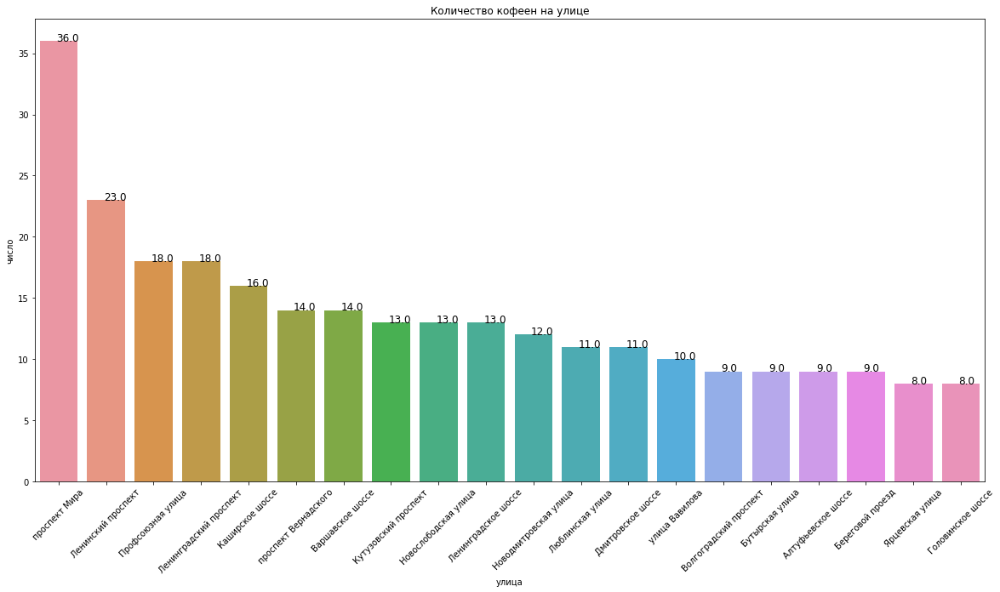

In [64]:
f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data=top_street, x='street', y='cnt')

ax.set_xlabel('улица')
ax.set_ylabel('число')
ax.set_title('Количество кофеен на улице')
plt.xticks(rotation=45)
ann(ax,top_street['cnt'])
plt.show()

                                 street  cnt  median_cup
130           Большая Семёновская улица    3       851.0
126             Большая Никитская улица    3       328.0
507               3-я Фрунзенская улица    1       320.0
412         Большая Сухаревская площадь    1       300.0
419               Богословский переулок    1       300.0
236              3-й Крутицкий переулок    2       291.0
345                      площадь Победы    1       291.0
342                    улица Гарибальди    1       291.0
602                Милютинский переулок    1       290.0
246                    Енисейская улица    2       287.0
205                 Стремянный переулок    2       285.0
63                      Мясницкая улица    4       283.0
241              улица Серпуховский Вал    2       275.0
549            Спиридоньевский переулок    1       275.0
464        2-й Сыромятнический переулок    1       275.0
80   Центральный административный округ    4       275.0
589               Лаврушинский 

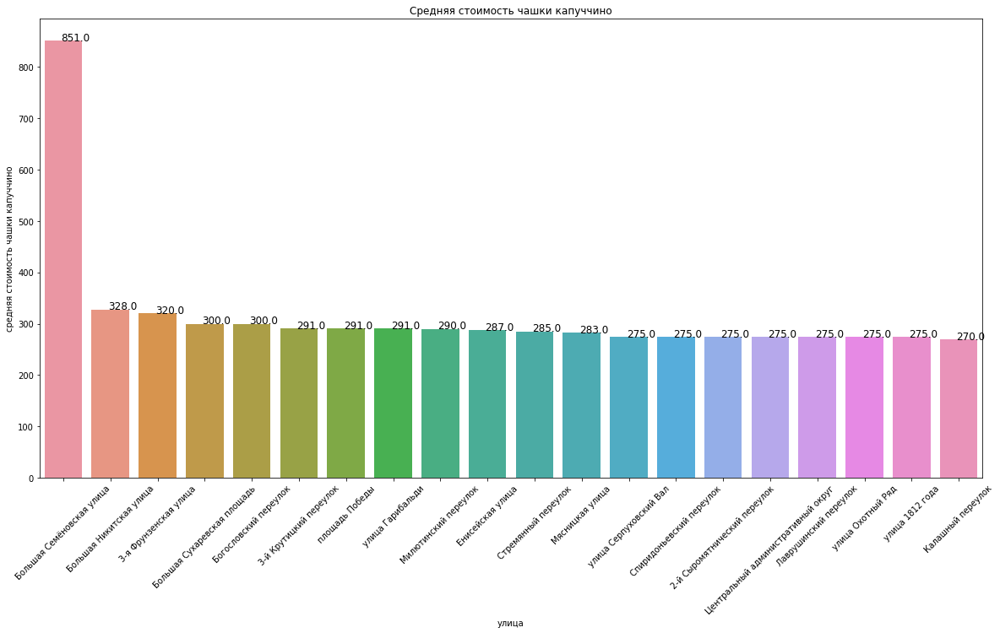

In [65]:
top_street_cup = cafes_street.sort_values(by='median_cup', ascending=False).head(20)
print(top_street_cup)
f, ax = plt.subplots(figsize=(20, 10))

ax = sns.barplot(data=top_street_cup, x='street', y='median_cup')

ax.set_xlabel('улица')
ax.set_ylabel('cредняя стоимость чашки капуччино')
ax.set_title('Средняя стоимость чашки капуччино')
plt.xticks(rotation=45)
ann(ax,top_street_cup['median_cup'])
plt.show()

In [66]:
cafes_street.sort_values(by = 'median_cup', ascending = False)
cafes[cafes['street'] == "Большая Семёновская улица"]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2576,Кофейная история,кофейня,"Москва, Большая Семёновская улица, 10, стр. 13",Восточный административный округ,"пн-пт 07:30–21:00; сб,вс 10:00–20:00",55.782477,37.702322,5.0,NaN,Цена чашки капучино:119–149 ₽,0.0,134.0,0,0,Большая Семёновская улица,False
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,0.0,1568.0,1,48,Большая Семёновская улица,False
2883,One Price Coffee,кофейня,"Москва, Большая Семёновская улица, 17А",Восточный административный округ,"ежедневно, 07:00–23:00",55.782773,37.705970,4.2,NaN,0,0.0,0.0,1,30,Большая Семёновская улица,False


### Вывод по местоположению

Самое большое количество кофеен в центральном административном округе - 428, а меньше всего - 62. Но самая высокая медианная стоимость чашки капуччино в Юго-западном округе - 198, а в центральном - 190. Средний рейтинг кофеен примерно одинаков во всех округах, только в Западном чуть ниже - 4.2, против 4.3 у всех остальных.
Больше всего кофеен расположено на проспекте Мира - 36. А вот самая высокая средняя стоимость чашки капуччино на Большая Семёновская улица -	851.0. Думаю, что это ошибка ввода, так как в кофейнях "Шоколадница" самая дорогая чашка капуччино 290 рублей. А вот уже следующее значение вполне реально: Большая Никитская улица	- 328.0 руб. Улицы с самым большим ценником расположены практически все в ЦАО (кроме аномально попавшей в этот список - Большой Семеновской) и еще в Юго-Западном ао.


### карта расположения кофеен Москвы

In [67]:
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

from folium.features import CustomIcon
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon_url = 'https://img.icons8.com/external-doodle-color-bomsymbols-/2x/external-cafe-set01-coffee-colors-doodle-doodle-color-bomsymbols--6.png'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cafes.apply(create_clusters, axis=1)

# выводим карту
m3

Не очень большое количество кофеен в некоторых районах Москвы может объясняться нахождением там больших парков, таких как Битцевский парк в Юго-западном или парк Кузьминки в Юго-восточном.

### карта расположения кофеен Москвы с ценой чашки кофе от 170 рублей

In [68]:
cup170 = cafes[cafes['middle_coffee_cup'] >= 170]

m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

from folium.features import CustomIcon
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    icon_url = 'https://img.icons8.com/external-doodle-color-bomsymbols-/2x/external-cafe-set01-coffee-colors-doodle-doodle-color-bomsymbols--6.png'
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
cup170.apply(create_clusters, axis=1)

# выводим карту
m4

Больше всего кофеен с ценой чашки капуччино больше медианной находится в центральном ао, а меньше всего - в Юго-восточном. 

### Тепловая карта рейтинга кофеен

In [69]:
rating_cafes = cafes.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
rating_cafes

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [70]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_cafes,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m5)

# выводим карту
m5

Самый высокий рейтинг у кофеен в Центральном административном округе - 4.34, а самый низкий в Западном административном округе - 4.19.

## Вывод

Для принятия  решения по открытию кофейни не хватает данных, таких как цена аренды (или стоимости квадратного метра) недвижимости, проходимости и, желательно, окупаемости у существующих заведений, ну и, конечно, суммы планируемых инвестиций. Но исходя из имеющихся данных сделаю следующие предложения.

Формат кофейни "из сериала Друзья", предполагает, что основной клиент не будет забегать быстренько купить кофе и дальше торопиться. Этот формат предполагает, что кофейня будет восприниматься, как некое культурное пространство, где можно выпить кофе, пообщаться с друзьями, посидеть за ноутбуком, послушать артистов. Это должно быть заведение на 30-40 мест, причем большинство столиков на 2х, ну и как фишка - диван для большой компании.
Ну и наличие официантки, также накладывает требование.

Соответственно, в кофейне с такой фишкой чашка капуччино не может стоить 70 рублей. Плюс проходимость должна быть высокой. Скорее всего, такой формат хорошо впишется в районы с большой платежеспособной молодежной аудиторией. Так что предлагаю рассмотреть **Центральный административный округ и улицы из списка Топ-20 улиц по цене чашки капуччино:** Большая Никитская улица, Большая Сухаревская площадь, Богословский переулок, 3-й Крутицкий переулок , например. Кроме того, там и число кофеен на каждой улицу 1-3 штук. 

Средняя стоимость чашки кофе в ЦАО - 190 руб., максимальная - 328. Без учета себестоимости (так как нет данных об этом) предлагаю поставить не менее **259 руб**. Так как цена точно доллжна быть выше средней, но так как аудитория молодежная, то максимальной можно отпугнуть.


## Презентация
https://disk.yandex.ru/d/sdLmburU3oZpyQ